# Wine Quality Prediction

# Dataset Selection
- We are selecting **Wine Quality dataset**.
- link : https://archive.ics.uci.edu/dataset/186/wine+quality

# Required Liberaries

In [21]:
# importing liberaries
import pandas as pd
import numpy as np
import warnings as w
w.filterwarnings('ignore')
import math

# for visualization
import matplotlib.pyplot as plt
import seaborn as sns

# metrics
from sklearn.metrics import classification_report, accuracy_score, confusion_matrix
from scipy import stats

#models
from imblearn.over_sampling import SMOTE
from sklearn.model_selection import train_test_split, GridSearchCV, RandomizedSearchCV
from sklearn.preprocessing import LabelEncoder, StandardScaler
from sklearn.svm import SVC
from sklearn.linear_model import LogisticRegression
from sklearn.naive_bayes import GaussianNB
from sklearn.ensemble import RandomForestClassifier
from sklearn.neighbors import KNeighborsClassifier
from sklearn.tree import DecisionTreeClassifier

# Data Import

In [23]:
# pip install ucimlrepo

from ucimlrepo import fetch_ucirepo

# fetch dataset
wine_quality = fetch_ucirepo(id=186)

# data (as pandas dataframes)
x = wine_quality.data.features
y = wine_quality.data.targets

In [24]:
x.columns

Index(['fixed_acidity', 'volatile_acidity', 'citric_acid', 'residual_sugar',
       'chlorides', 'free_sulfur_dioxide', 'total_sulfur_dioxide', 'density',
       'pH', 'sulphates', 'alcohol'],
      dtype='object')

In [25]:
y

,quality
0,5
1,5
2,5
3,6
4,5
...,...
6492,6
6493,5
6494,6
6495,7


## combining datasets

In [27]:
a = np.hstack([x,y])

In [29]:
df = pd.DataFrame(a,columns=['fixed_acidity', 'volatile_acidity', 'citric_acid', 'residual_sugar',
       'chlorides', 'free_sulfur_dioxide', 'total_sulfur_dioxide', 'density',
       'pH', 'sulphates', 'alcohol','quality'])
df

,fixed_acidity,volatile_acidity,citric_acid,residual_sugar,chlorides,free_sulfur_dioxide,total_sulfur_dioxide,density,pH,sulphates,alcohol,quality
0,7.4,0.70,0.00,1.9,0.076,11.0,34.0,0.99780,3.51,0.56,9.4,5.0
1,7.8,0.88,0.00,2.6,0.098,25.0,67.0,0.99680,3.20,0.68,9.8,5.0
2,7.8,0.76,0.04,2.3,0.092,15.0,54.0,0.99700,3.26,0.65,9.8,5.0
3,11.2,0.28,0.56,1.9,0.075,17.0,60.0,0.99800,3.16,0.58,9.8,6.0
4,7.4,0.70,0.00,1.9,0.076,11.0,34.0,0.99780,3.51,0.56,9.4,5.0
...,...,...,...,...,...,...,...,...,...,...,...,...
6492,6.2,0.21,0.29,1.6,0.039,24.0,92.0,0.99114,3.27,0.50,11.2,6.0
6493,6.6,0.32,0.36,8.0,0.047,57.0,168.0,0.99490,3.15,0.46,9.6,5.0
6494,6.5,0.24,0.19,1.2,0.041,30.0,111.0,0.99254,2.99,0.46,9.4,6.0
6495,5.5,0.29,0.30,1.1,0.022,20.0,110.0,0.98869,3.34,0.38,12.8,7.0


In [30]:
# pandas profiling 
import pandas_profiling
file  = pandas_profiling.ProfileReport(df)
file

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

In [36]:
# Saving Pandas Profiling file as a html page 
file.to_file("Pandas_profiling_report.html")

Export report to file:   0%|          | 0/1 [00:00<?, ?it/s]

# EDA (Exploratory Data Analysis) and Visualization of Features

In [14]:
df

,fixed_acidity,volatile_acidity,citric_acid,residual_sugar,chlorides,free_sulfur_dioxide,total_sulfur_dioxide,density,pH,sulphates,alcohol,quality
0,7.4,0.70,0.00,1.9,0.076,11.0,34.0,0.99780,3.51,0.56,9.4,5.0
1,7.8,0.88,0.00,2.6,0.098,25.0,67.0,0.99680,3.20,0.68,9.8,5.0
2,7.8,0.76,0.04,2.3,0.092,15.0,54.0,0.99700,3.26,0.65,9.8,5.0
3,11.2,0.28,0.56,1.9,0.075,17.0,60.0,0.99800,3.16,0.58,9.8,6.0
4,7.4,0.70,0.00,1.9,0.076,11.0,34.0,0.99780,3.51,0.56,9.4,5.0
...,...,...,...,...,...,...,...,...,...,...,...,...
6492,6.2,0.21,0.29,1.6,0.039,24.0,92.0,0.99114,3.27,0.50,11.2,6.0
6493,6.6,0.32,0.36,8.0,0.047,57.0,168.0,0.99490,3.15,0.46,9.6,5.0
6494,6.5,0.24,0.19,1.2,0.041,30.0,111.0,0.99254,2.99,0.46,9.4,6.0
6495,5.5,0.29,0.30,1.1,0.022,20.0,110.0,0.98869,3.34,0.38,12.8,7.0


In [15]:
# Display the first few rows, data info, and basic statistics
display("First few rows:", df.head())
print("\n")
display("Summary Statistics:", df.describe().T)
print("\nData Info:\n")
df.info()

'First few rows:'

,fixed_acidity,volatile_acidity,citric_acid,residual_sugar,chlorides,free_sulfur_dioxide,total_sulfur_dioxide,density,pH,sulphates,alcohol,quality
0,7.4,0.70,0.00,1.9,0.076,11.0,34.0,0.9978,3.51,0.56,9.4,5.0
1,7.8,0.88,0.00,2.6,0.098,25.0,67.0,0.9968,3.20,0.68,9.8,5.0
2,7.8,0.76,0.04,2.3,0.092,15.0,54.0,0.9970,3.26,0.65,9.8,5.0
3,11.2,0.28,0.56,1.9,0.075,17.0,60.0,0.9980,3.16,0.58,9.8,6.0
4,7.4,0.70,0.00,1.9,0.076,11.0,34.0,0.9978,3.51,0.56,9.4,5.0


'Summary Statistics:'

,count,mean,std,min,25%,50%,75%,max
fixed_acidity,6497.0,7.215307,1.296434,3.80000,6.40000,7.00000,7.70000,15.90000
volatile_acidity,6497.0,0.339666,0.164636,0.08000,0.23000,0.29000,0.40000,1.58000
citric_acid,6497.0,0.318633,0.145318,0.00000,0.25000,0.31000,0.39000,1.66000
residual_sugar,6497.0,5.443235,4.757804,0.60000,1.80000,3.00000,8.10000,65.80000
chlorides,6497.0,0.056034,0.035034,0.00900,0.03800,0.04700,0.06500,0.61100
free_sulfur_dioxide,6497.0,30.525319,17.749400,1.00000,17.00000,29.00000,41.00000,289.00000
total_sulfur_dioxide,6497.0,115.744574,56.521855,6.00000,77.00000,118.00000,156.00000,440.00000
density,6497.0,0.994697,0.002999,0.98711,0.99234,0.99489,0.99699,1.03898
pH,6497.0,3.218501,0.160787,2.72000,3.11000,3.21000,3.32000,4.01000
sulphates,6497.0,0.531268,0.148806,0.22000,0.43000,0.51000,0.60000,2.00000



Data Info:

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 6497 entries, 0 to 6496
Data columns (total 12 columns):
 #   Column                Non-Null Count  Dtype  
---  ------                --------------  -----  
 0   fixed_acidity         6497 non-null   float64
 1   volatile_acidity      6497 non-null   float64
 2   citric_acid           6497 non-null   float64
 3   residual_sugar        6497 non-null   float64
 4   chlorides             6497 non-null   float64
 5   free_sulfur_dioxide   6497 non-null   float64
 6   total_sulfur_dioxide  6497 non-null   float64
 7   density               6497 non-null   float64
 8   pH                    6497 non-null   float64
 9   sulphates             6497 non-null   float64
 10  alcohol               6497 non-null   float64
 11  quality               6497 non-null   float64
dtypes: float64(12)
memory usage: 609.2 KB


### Insights

1. By examining the first few rows and info() output, we confirm there are 11 features and **no missing values**.

2. Summary statistics help us understand the ranges and distributions of each feature (e.g., min, max, mean). For example, alcohol has a range from 8% to 14%, and pH ranges from about 2.7 to 4. This can guide normalization and outlier detection later.

## 1. Checking for Missing Values and Duplicates

In [18]:
# missing value
print("No. of missing values:",df.isna().sum())

No. of missing values: fixed_acidity           0
volatile_acidity        0
citric_acid             0
residual_sugar          0
chlorides               0
free_sulfur_dioxide     0
total_sulfur_dioxide    0
density                 0
pH                      0
sulphates               0
alcohol                 0
quality                 0
dtype: int64


In [19]:
# duplicate values
print("NO. of duplicate values:",df.duplicated().sum())

NO. of duplicate values: 1179


### Insights:

1. This dataset is complete, with no missing values.

3. There are 1179 duplicated values in the dataset.

## 2. Imbalance Data checking

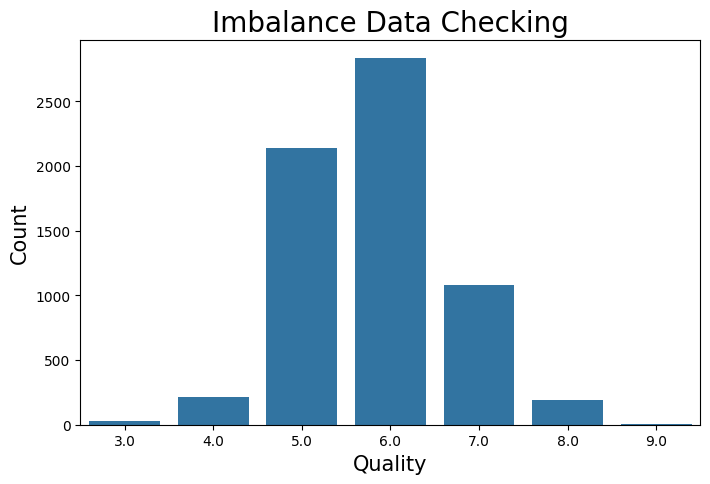

In [22]:
plt.figure(figsize=(8, 5))
sns.countplot(data=df,x='quality')
plt.title("Imbalance Data Checking",fontsize=20)
plt.xlabel("Quality",fontsize=15)
plt.ylabel("Count",fontsize=15)
plt.show()

### Insights
- Our Dataset is __Imbalanced__.
  
- we can observe an imbalance where quality scores of 5,6 and 7 are the majority classes, while classes 3, 4, 8, and 9 have significantly fewer samples. This imbalance may cause our model to favor predictions for the majority classes, reducing its ability to accurately classify the minority classes.

- We have to apply technique to solve this problem, the technique could be SMOTE etc.

## 3. Outlier Detection

In [25]:
len(df.columns)

12

In [26]:
df.columns

Index(['fixed_acidity', 'volatile_acidity', 'citric_acid', 'residual_sugar',
       'chlorides', 'free_sulfur_dioxide', 'total_sulfur_dioxide', 'density',
       'pH', 'sulphates', 'alcohol', 'quality'],
      dtype='object')

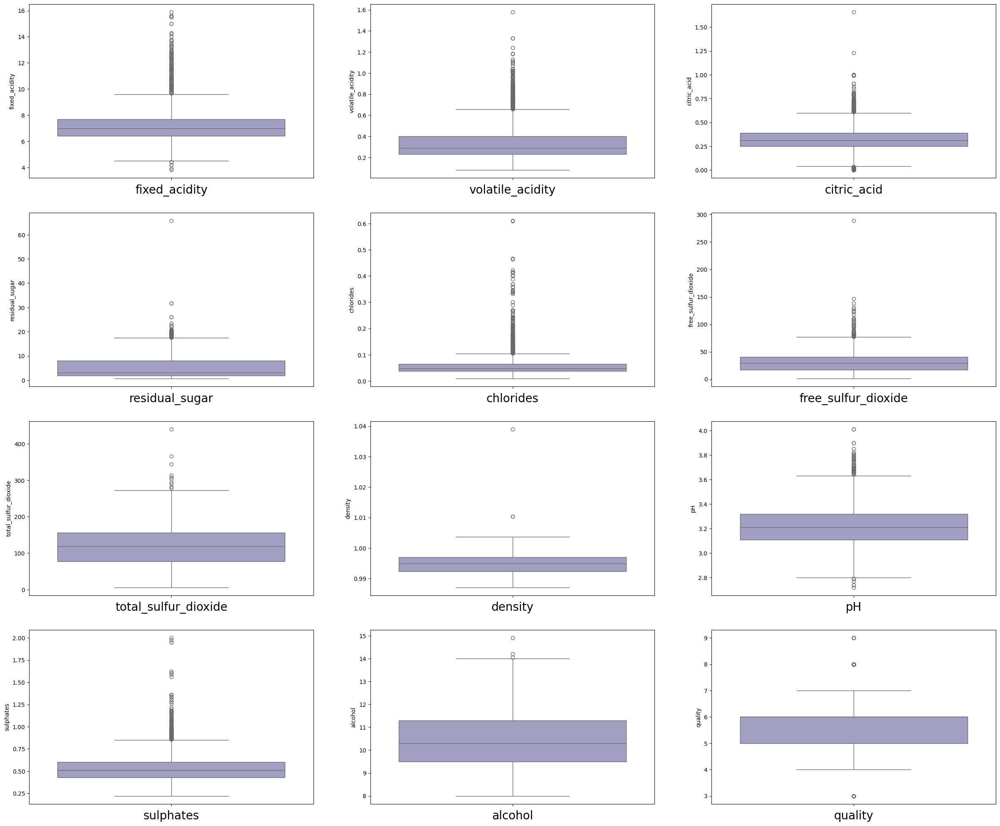

In [27]:
columns = df.columns

plt.figure(figsize=(30,25)) # defining canvas size
plot = 1

for column in columns:
    if plot <= len(columns):
        plt.subplot(4,3,plot)
        sns.boxplot(df[column],palette="Purples")
        plt.xlabel(column,fontsize=20)
    plot += 1
plt.show()

### Insights

- We have outliers in these feature :-  'fixed_acidity', 'volatile_acidity', 'citric_acid', 'residual_sugar', 'chlorides', 'free_sulfur_dioxide','total_sulfur_dioxide', 'density','pH', 'sulphates', 'alcohol'.

## 4. Correlation Analysis
- Objective: Check correlations between features to identify any multicollinearity or key feature relationships.

In [30]:
correlation_matrix = df.corr()
correlation_matrix

,fixed_acidity,volatile_acidity,citric_acid,residual_sugar,chlorides,free_sulfur_dioxide,total_sulfur_dioxide,density,pH,sulphates,alcohol,quality
fixed_acidity,1.000000,0.219008,0.324436,-0.111981,0.298195,-0.282735,-0.329054,0.458910,-0.252700,0.299568,-0.095452,-0.076743
volatile_acidity,0.219008,1.000000,-0.377981,-0.196011,0.377124,-0.352557,-0.414476,0.271296,0.261454,0.225984,-0.037640,-0.265699
citric_acid,0.324436,-0.377981,1.000000,0.142451,0.038998,0.133126,0.195242,0.096154,-0.329808,0.056197,-0.010493,0.085532
residual_sugar,-0.111981,-0.196011,0.142451,1.000000,-0.128940,0.402871,0.495482,0.552517,-0.267320,-0.185927,-0.359415,-0.036980
chlorides,0.298195,0.377124,0.038998,-0.128940,1.000000,-0.195045,-0.279630,0.362615,0.044708,0.395593,-0.256916,-0.200666
free_sulfur_dioxide,-0.282735,-0.352557,0.133126,0.402871,-0.195045,1.000000,0.720934,0.025717,-0.145854,-0.188457,-0.179838,0.055463
total_sulfur_dioxide,-0.329054,-0.414476,0.195242,0.495482,-0.279630,0.720934,1.000000,0.032395,-0.238413,-0.275727,-0.265740,-0.041385
density,0.458910,0.271296,0.096154,0.552517,0.362615,0.025717,0.032395,1.000000,0.011686,0.259478,-0.686745,-0.305858
pH,-0.252700,0.261454,-0.329808,-0.267320,0.044708,-0.145854,-0.238413,0.011686,1.000000,0.192123,0.121248,0.019506
sulphates,0.299568,0.225984,0.056197,-0.185927,0.395593,-0.188457,-0.275727,0.259478,0.192123,1.000000,-0.003029,0.038485


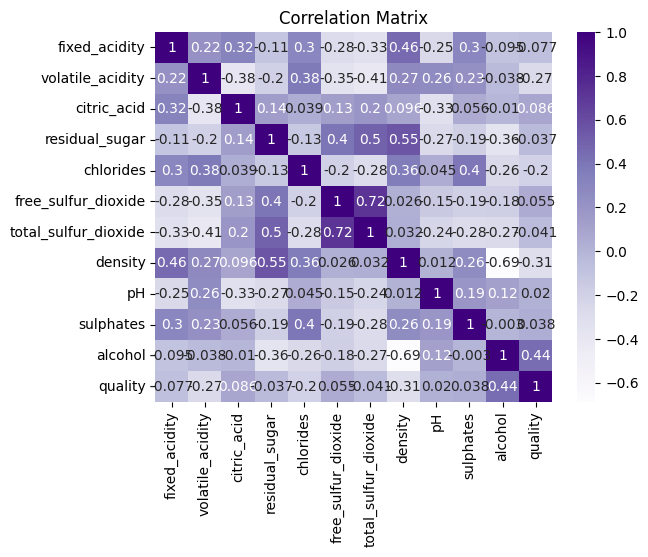

In [31]:
sns.heatmap(correlation_matrix, annot=True,cmap="Purples")
plt.title("Correlation Matrix")
plt.show()

### Insights:

- Features with high correlations (e.g., density and residual sugar) suggest potential multicollinearity, which could affect model interpretability.

- Some features are moderately correlated with quality, such as alcohol, which has a positive relationship with quality, suggesting it may be a key factor in predicting wine quality.

## 5. Pair Plot for Feature Relationships

In [34]:
df.columns

Index(['fixed_acidity', 'volatile_acidity', 'citric_acid', 'residual_sugar',
       'chlorides', 'free_sulfur_dioxide', 'total_sulfur_dioxide', 'density',
       'pH', 'sulphates', 'alcohol', 'quality'],
      dtype='object')

In [35]:
for i in [3,4,5,6,7,8,9]:
    print(f"Quality {i} :{df['pH'][df['quality'] == i].count()}")

Quality 3 :30
Quality 4 :216
Quality 5 :2138
Quality 6 :2836
Quality 7 :1079
Quality 8 :193
Quality 9 :5


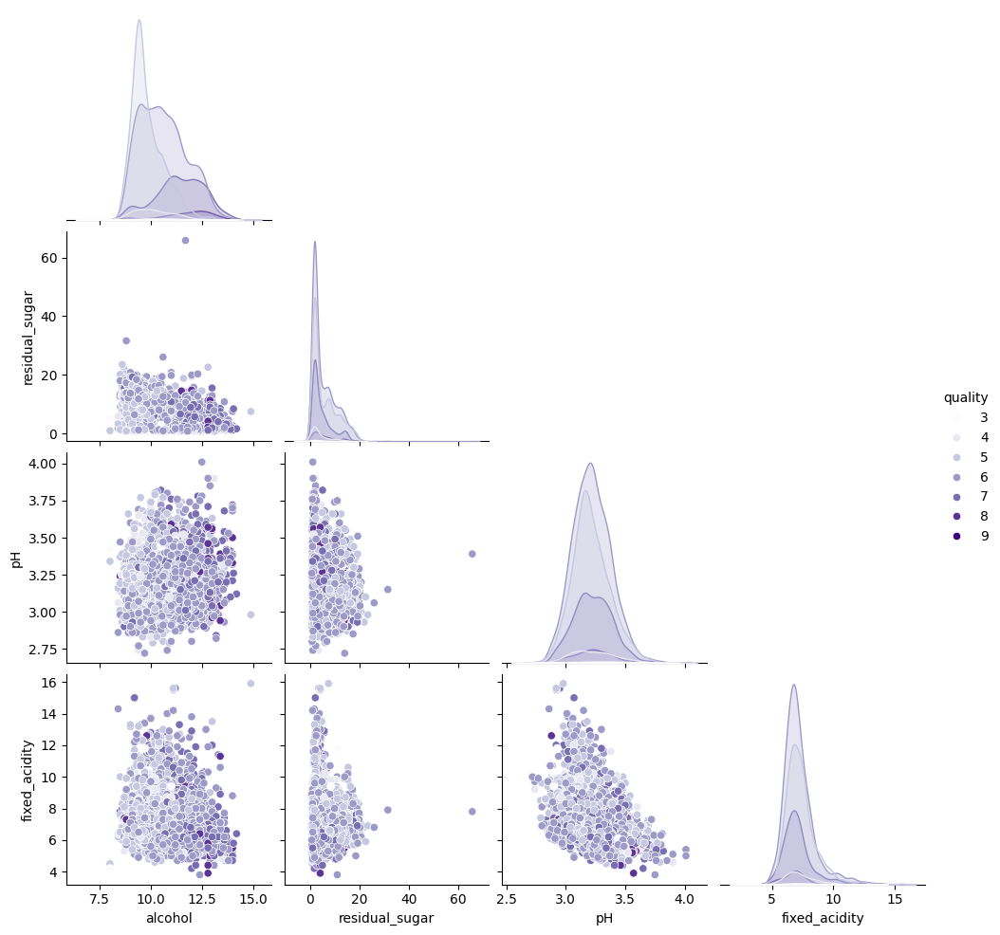

In [36]:
sns.pairplot(data=df,vars=["alcohol", "residual_sugar", "pH", "fixed_acidity"],
            hue='quality',palette="Purples",corner=True)

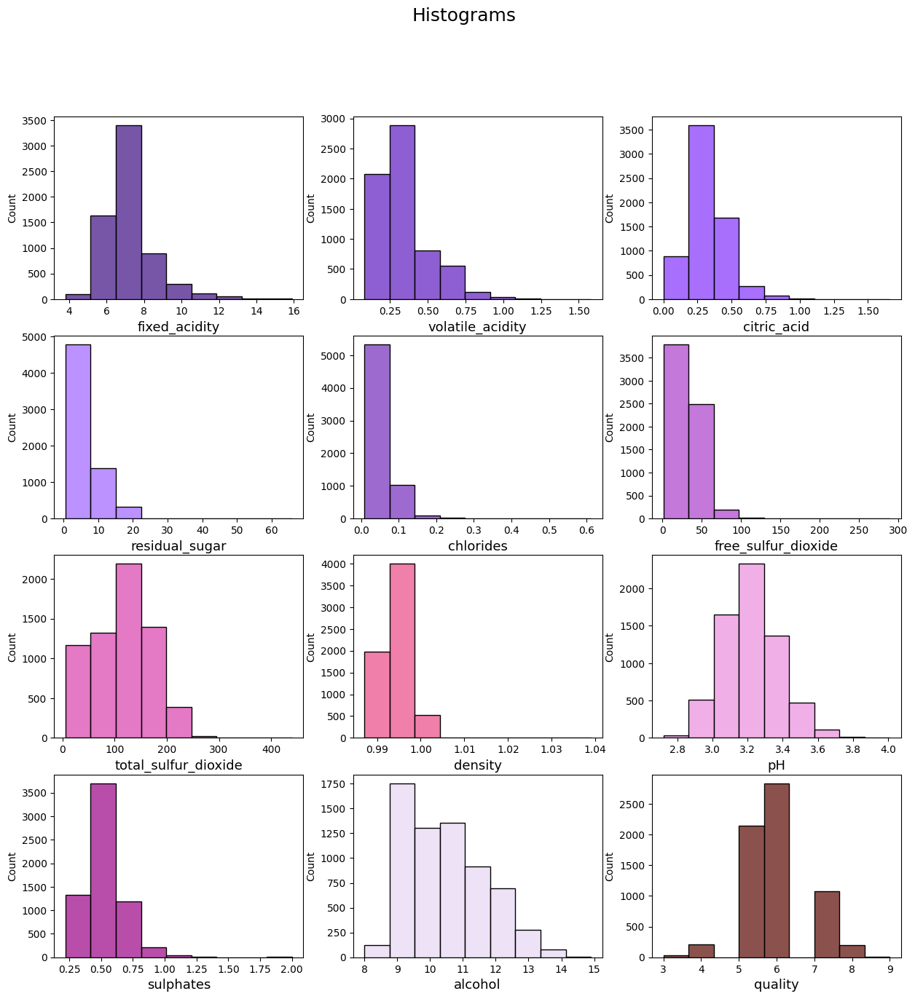

In [37]:
plt.figure(figsize=(15, 15))
colors = ['#491D8B', '#6929C4', '#8A3FFC', '#A56EFF',
          '#7D3AC1', '#AF4BCE', '#DB4CB2', '#EB548C',
          '#EC96E0', '#A2128E', '#E8D9F3', '#641811']
plot = 1
for column,i in zip(df.columns,colors):
    plt.subplot(4,3,plot)
    sns.histplot(df[column],bins=9,color=i)
    plt.xlabel(column,fontsize=13)
    plot+=1

plt.suptitle("Histograms", size = 18)
plt.show()

### Insights:
- Most of the values of the "fixed_acidity" variable are in the range of 7 - 8;

- Most of the values of the "volatile_acidity" variable are in the range of 0.4 - 0.7;

- Most values of the "citric_acid" variable are in the range of 0.0 - 0.1;

- Most of the values of the "residual_sugar" variable are in the range of 1 - 2.5;

- Most of the values of the "chlorides" variable are in the range of 0.085 - 0.15;

- Most values of the "free_sulfur_dioxide" variable are in the range 0 - 15;

- Most values of the "total_sulfur_dioxide" variable are in the range 0 - 30;

- Most of the values of the "density" variable are in the range of 0.996 - 0.998;

- Most of the values of the "pH" variable are in the range of 3.2 - 3.4;

- Most of the values of the "sulphates" variable are in the range of 0.50 - 0.75;

- Most of the values of the "alcohol" variable are in the range of 9 - 10;

- Most values of the "quality" variable are 5 and 6.

## 6. histplot Quality vs others.

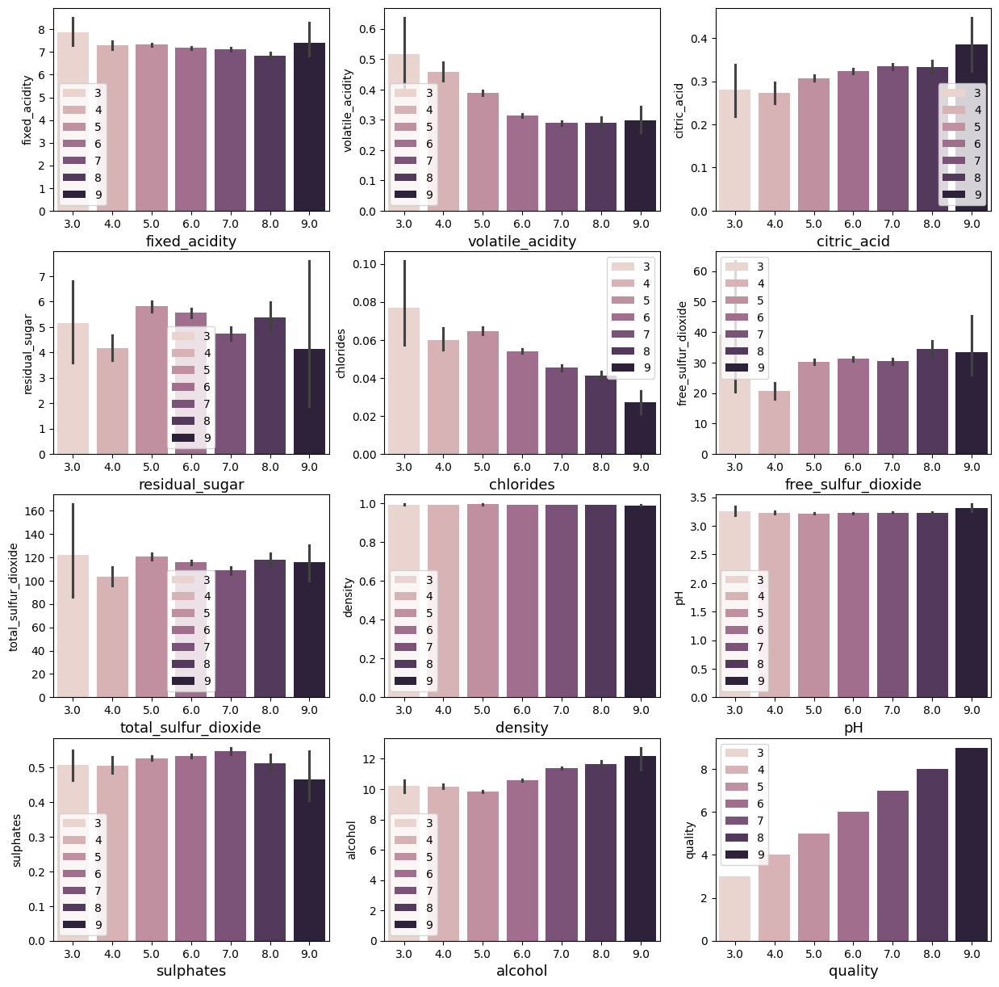

In [40]:
plt.figure(figsize=(15,15))
plot =1
for i in df.columns:
    plt.subplot(4,3,plot)
    sns.barplot(x=df['quality'],y=df[i],hue=df['quality'])
    plt.xlabel(i, fontsize=13)
    plot += 1
    plt.legend(loc="best")
plt.show()

### Insights:
1. Here we see that fixed acidity does not give any specification to classify the quality.
2. Here we see that its quite a downing trend in the volatile acidity as we go higher the quality
3. Composition of citric acid go higher as we go higher in the quality of the wine
4. Here we see that residual sugar does not give any specification to classify the quality.
5. Composition of chloride also go down as we go higher in the quality of the wine
6. Here we see that free_sulfure_dioxide does not give any specification to classify the quality.
7. Here we see that total_sulfure_dioxide does not give any specification to classify the quality.
8. Alcohol level also goes higher as te quality of wine increases

## 7. Skewness and Kurtosis

In [43]:
df.agg(['skew','kurtosis']).T

,skew,kurtosis
fixed_acidity,1.723290,5.061161
volatile_acidity,1.495097,2.825372
citric_acid,0.471731,2.397239
residual_sugar,1.435404,4.359272
chlorides,5.399828,50.898051
free_sulfur_dioxide,1.220066,7.906238
total_sulfur_dioxide,-0.001177,-0.371664
density,0.503602,6.606067
pH,0.386839,0.367657
sulphates,1.797270,8.653699


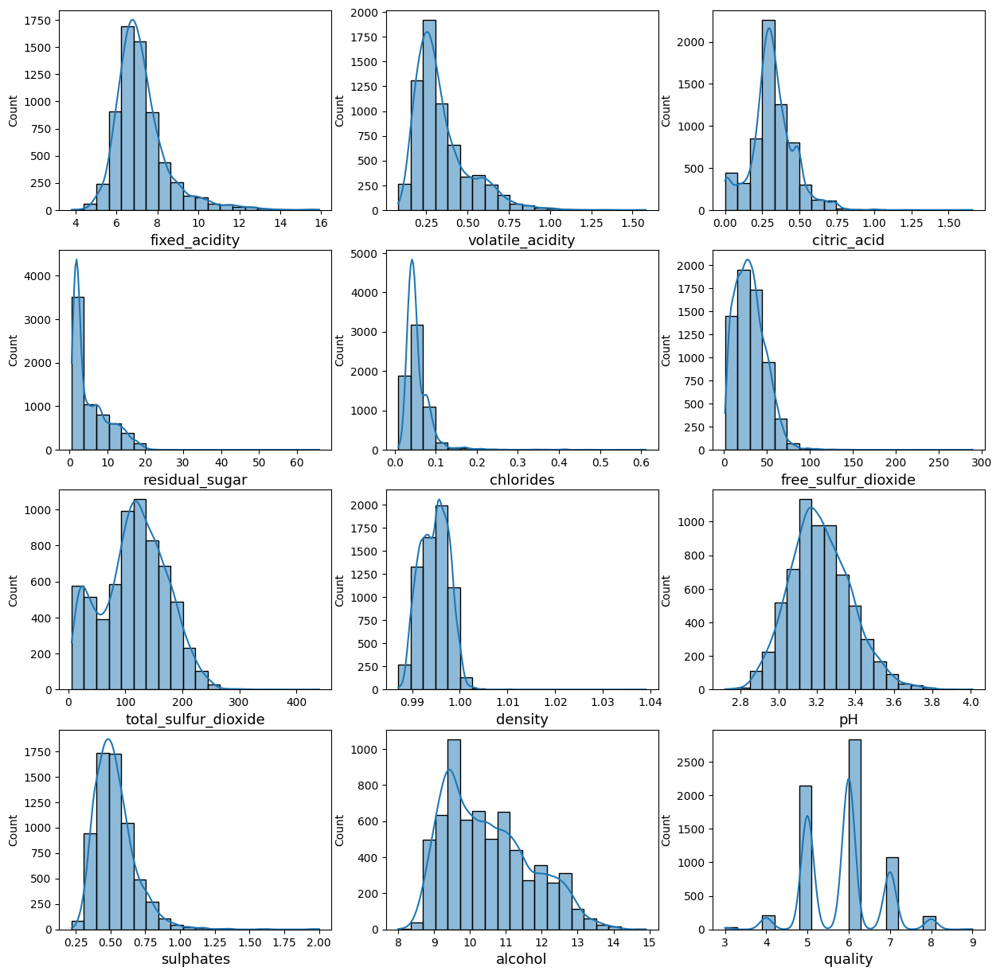

In [44]:
plt.figure(figsize=(15, 15))
plot = 1
for column in df.columns:
    plt.subplot(4,3,plot)
    sns.histplot(df[column],bins=20,kde=True)
    plt.xlabel(column,fontsize=13)
    plot+=1
plt.show()

### Insights:
- Here these all columns are __"Highly Positively Skewed"__ :-
    - 'fixed_acidity', 'volatile_acidity', 'citric_acid', 'residual_sugar', 'chlorides', 'free_sulfur_dioxide', 'total_sulfur_dioxide', 'density', 'sulphates', 'alcohol'.
      

- To standerdize it we are going to use the __Log Transformation__.


In [46]:
df.columns

Index(['fixed_acidity', 'volatile_acidity', 'citric_acid', 'residual_sugar',
       'chlorides', 'free_sulfur_dioxide', 'total_sulfur_dioxide', 'density',
       'pH', 'sulphates', 'alcohol', 'quality'],
      dtype='object')

In [47]:
skewed_features = df.skew()
print("\nSkewness of features:\n", skewed_features)


Skewness of features:
 fixed_acidity           1.723290
volatile_acidity        1.495097
citric_acid             0.471731
residual_sugar          1.435404
chlorides               5.399828
free_sulfur_dioxide     1.220066
total_sulfur_dioxide   -0.001177
density                 0.503602
pH                      0.386839
sulphates               1.797270
alcohol                 0.565718
quality                 0.189623
dtype: float64


# Data Processing (Feature Engineering)

## 1. Outlier Removal

- We have already seen the Outlier in the EDA.
- We are going to use the IQR method to remove the outliers.

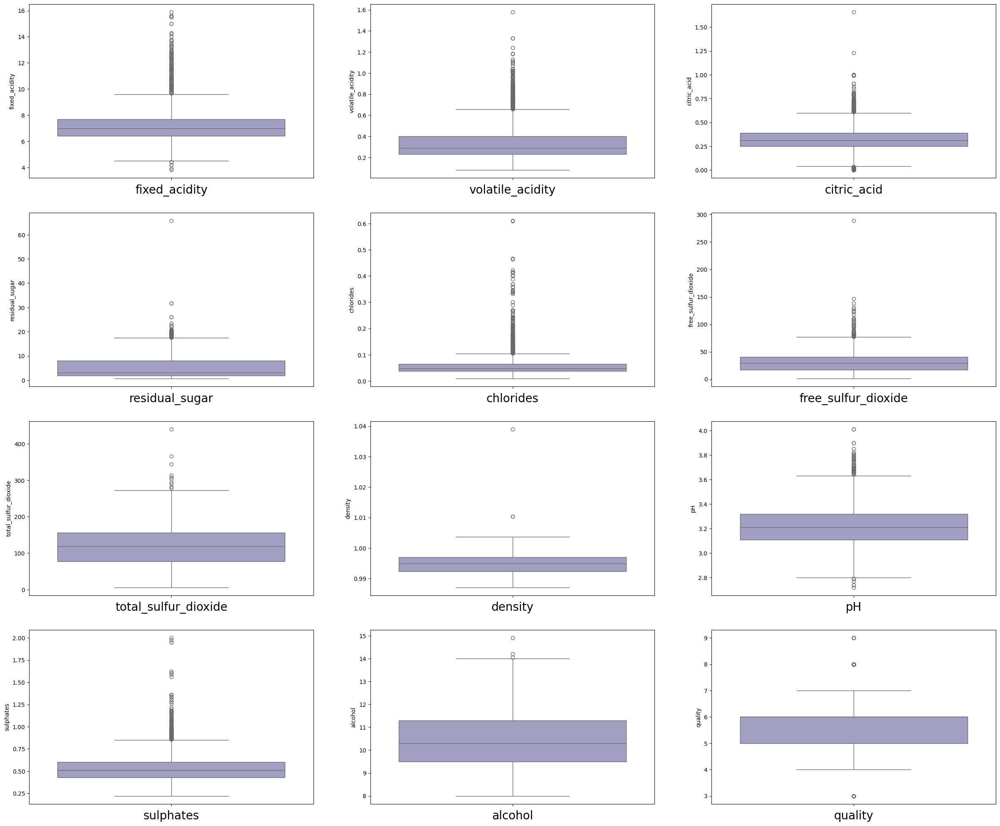

In [51]:
columns = df.columns

plt.figure(figsize=(30,25)) # defining canvas size
plot = 1

for column in columns:
    if plot <= len(columns):
        plt.subplot(4,3,plot)
        sns.boxplot(df[column],palette="Purples")
        plt.xlabel(column,fontsize=20)
    plot += 1
plt.show()

In [52]:
# columns for outlier removal
cols = ['fixed_acidity', 'volatile_acidity', 'citric_acid', 'residual_sugar', 'chlorides',
        'free_sulfur_dioxide','total_sulfur_dioxide', 'density','pH', 'sulphates', 'alcohol']

# Create a copy original data
df_cleaned = df.copy()

# Remove outliers for each column using IQR
for col in cols:
    Q1 = df_cleaned[col].quantile(0.25)
    Q3 = df_cleaned[col].quantile(0.75)
    IQR = Q3 - Q1
    lower_bound = Q1 - 1.5 * IQR
    upper_bound = Q3 + 1.5 * IQR
    df_cleaned = df_cleaned[(df_cleaned[col] >= lower_bound) & (df_cleaned[col] <= upper_bound)]

print(f"Original dataset shape: {df.shape}")
print(f"Dataset shape after removing outliers: {df_cleaned.shape}")

Original dataset shape: (6497, 12)
Dataset shape after removing outliers: (4596, 12)


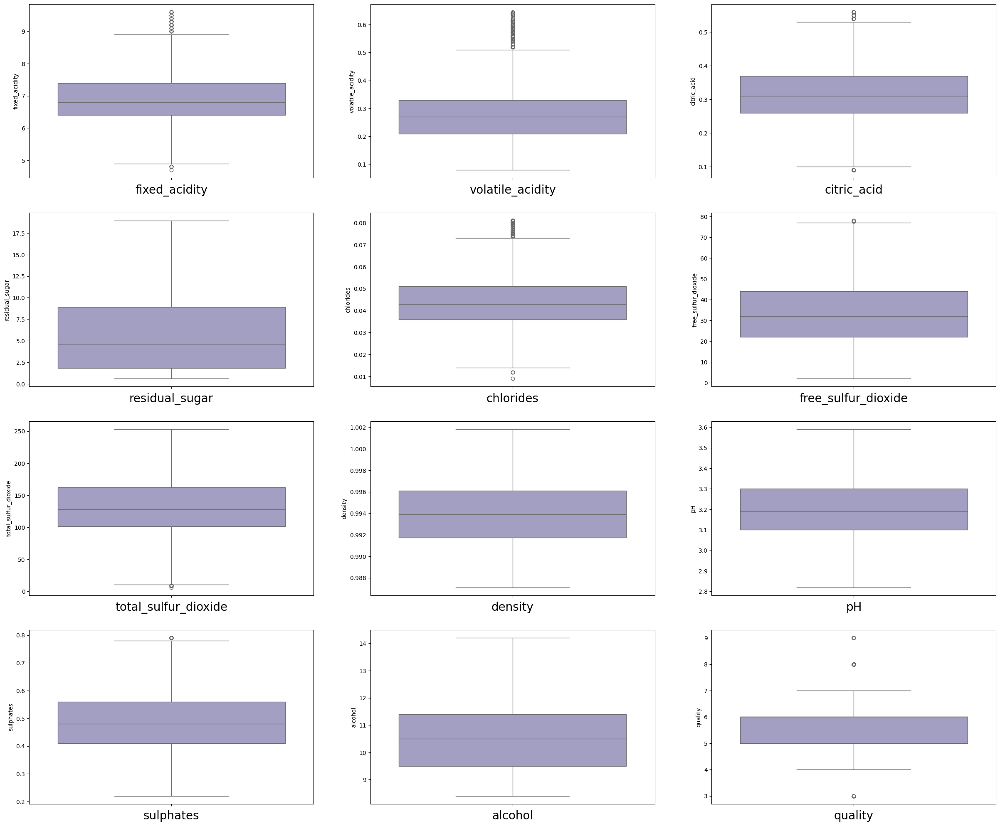

In [53]:
# dataframe without ouliers
columns = df_cleaned.columns

plt.figure(figsize=(30,25)) # defining canvas size
plot = 1

for column in columns:
    if plot <= len(columns):
        plt.subplot(4,3,plot)
        sns.boxplot(df_cleaned[column],palette="Purples")
        plt.xlabel(column,fontsize=20)
    plot += 1
plt.show()

## 2. Removing Skewness

- performing log transformation

In [56]:
df_cleaned = df_cleaned.reset_index(drop=True) # resetting index

In [57]:
col = ['fixed_acidity', 'volatile_acidity', 'citric_acid', 'residual_sugar', 'chlorides', 'free_sulfur_dioxide',
       'total_sulfur_dioxide', 'density', 'sulphates', 'alcohol']
for i in col:
    df_cleaned[i] = np.log(df_cleaned[i])

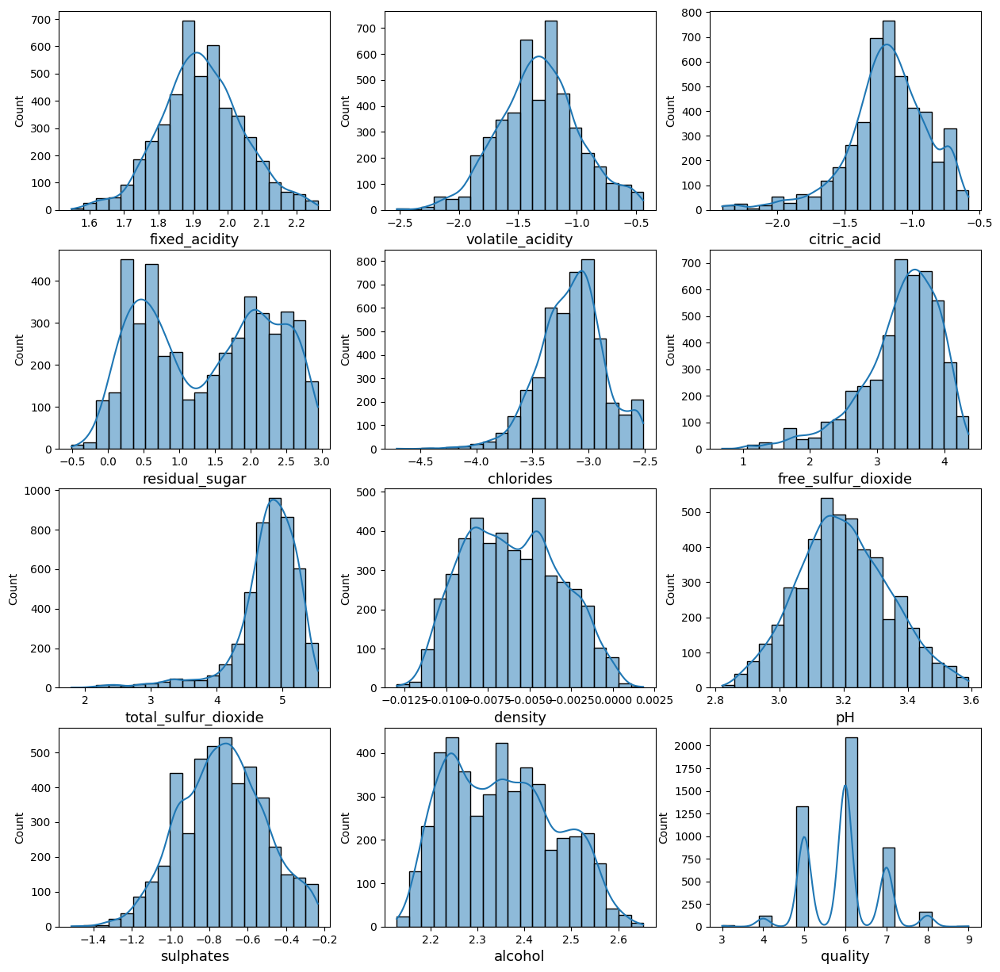

In [58]:
plt.figure(figsize=(15, 15))
plot = 1
for column in df_cleaned.columns:
    plt.subplot(4,3,plot)
    sns.histplot(df_cleaned[column],bins=20,kde=True)
    plt.xlabel(column,fontsize=13)
    plot+=1
plt.show()

## 3. Feature Scaling

In [60]:
df_cleaned

,fixed_acidity,volatile_acidity,citric_acid,residual_sugar,chlorides,free_sulfur_dioxide,total_sulfur_dioxide,density,pH,sulphates,alcohol,quality
0,2.186051,-1.514128,-0.733969,0.587787,-2.563950,3.367296,4.094345,-0.003205,3.39,-0.634878,2.240710,6.0
1,1.840550,-0.941609,-1.832581,0.336472,-2.525729,2.397895,3.135494,-0.004510,3.34,-0.579818,2.230014,5.0
2,2.028148,-0.891598,-1.427116,0.587787,-2.525729,1.386294,2.397895,-0.003807,3.28,-0.527633,2.251292,5.0
3,1.931521,-0.502527,-2.120264,2.370244,-2.617296,3.688879,4.418841,-0.000700,3.45,-0.653926,2.240710,6.0
4,2.091864,-0.967584,-1.272966,0.741937,-2.718101,2.564949,3.401197,-0.003205,3.23,-0.314711,2.272126,7.0
...,...,...,...,...,...,...,...,...,...,...,...,...
4591,1.824549,-1.560648,-1.237874,0.470004,-3.244194,3.178054,4.521789,-0.008899,3.27,-0.693147,2.415914,6.0
4592,1.887070,-1.139434,-1.021651,2.079442,-3.057608,4.043051,5.123964,-0.005113,3.15,-0.776529,2.261763,5.0
4593,1.871802,-1.427116,-1.660731,0.182322,-3.194183,3.401197,4.709530,-0.007488,2.99,-0.776529,2.240710,6.0
4594,1.704748,-1.237874,-1.203973,0.095310,-3.816713,2.995732,4.700480,-0.011374,3.34,-0.967584,2.549445,7.0


In [61]:
scaler = StandardScaler()
scaler

StandardScaler()

In [62]:
df_cleaned[['fixed_acidity', 'volatile_acidity', 'citric_acid', 'residual_sugar',
       'chlorides', 'free_sulfur_dioxide', 'total_sulfur_dioxide', 'density',
       'pH', 'sulphates', 'alcohol']] = scaler.fit_transform(df_cleaned[['fixed_acidity', 'volatile_acidity', 'citric_acid', 'residual_sugar',
       'chlorides', 'free_sulfur_dioxide', 'total_sulfur_dioxide', 'density',
       'pH', 'sulphates', 'alcohol']])

In [63]:
df_cleaned

,fixed_acidity,volatile_acidity,citric_acid,residual_sugar,chlorides,free_sulfur_dioxide,total_sulfur_dioxide,density,pH,sulphates,alcohol,quality
0,2.177319,-0.568405,1.465829,-0.924287,2.036746,0.008964,-1.397506,0.991677,1.318787,0.431567,-0.996061,6.0
1,-0.715100,1.094309,-2.132020,-1.204995,2.169078,-1.678537,-3.361408,0.531655,0.970064,0.683295,-1.090781,5.0
2,0.855410,1.239550,-0.804161,-0.924287,2.169078,-3.439499,-4.872147,0.779434,0.551597,0.921883,-0.902343,5.0
3,0.046484,2.369493,-3.074151,1.066648,1.852048,0.568766,-0.732878,1.874651,1.737253,0.344481,-0.996061,6.0
4,1.388817,1.018871,-0.299332,-0.752106,1.503035,-1.387735,-2.817199,0.991677,0.202875,1.895341,-0.717831,7.0
...,...,...,...,...,...,...,...,...,...,...,...,...
4591,-0.849049,-0.703509,-0.184412,-1.055846,-0.318441,-0.320462,-0.522021,-1.015585,0.481853,0.165168,0.555592,6.0
4592,-0.325651,0.519782,0.523698,0.741834,0.327570,1.185297,0.711345,0.319135,-0.355081,-0.216045,-0.809606,5.0
4593,-0.453465,-0.315706,-1.569227,-1.377176,-0.145291,0.067979,-0.137492,-0.518024,-1.470992,-0.216045,-0.996061,6.0
4594,-1.851983,0.233892,-0.073387,-1.474364,-2.300656,-0.637842,-0.156028,-1.888010,0.970064,-1.089530,1.738180,7.0


## 4. Encoding Target Variables

- Ratings 3–4 as "Low Quality"(0)
- Ratings 5–6 as "Medium Quality"(1)
- Ratings 7–8 as "High Quality"(2)

In [66]:
df_cleaned['quality'] = df_cleaned["quality"].apply(lambda x: 0 if (x==3)or(x==4) else (1 if (x==5)or(x==6) else 2))

In [67]:
df_cleaned.head()

,fixed_acidity,volatile_acidity,citric_acid,residual_sugar,chlorides,free_sulfur_dioxide,total_sulfur_dioxide,density,pH,sulphates,alcohol,quality
0,2.177319,-0.568405,1.465829,-0.924287,2.036746,0.008964,-1.397506,0.991677,1.318787,0.431567,-0.996061,1
1,-0.715100,1.094309,-2.132020,-1.204995,2.169078,-1.678537,-3.361408,0.531655,0.970064,0.683295,-1.090781,1
2,0.855410,1.239550,-0.804161,-0.924287,2.169078,-3.439499,-4.872147,0.779434,0.551597,0.921883,-0.902343,1
3,0.046484,2.369493,-3.074151,1.066648,1.852048,0.568766,-0.732878,1.874651,1.737253,0.344481,-0.996061,1
4,1.388817,1.018871,-0.299332,-0.752106,1.503035,-1.387735,-2.817199,0.991677,0.202875,1.895341,-0.717831,2


In [68]:
df_cleaned['quality'].unique()

array([1, 2, 0], dtype=int64)

## 5. Imbalance to Balanced dataset

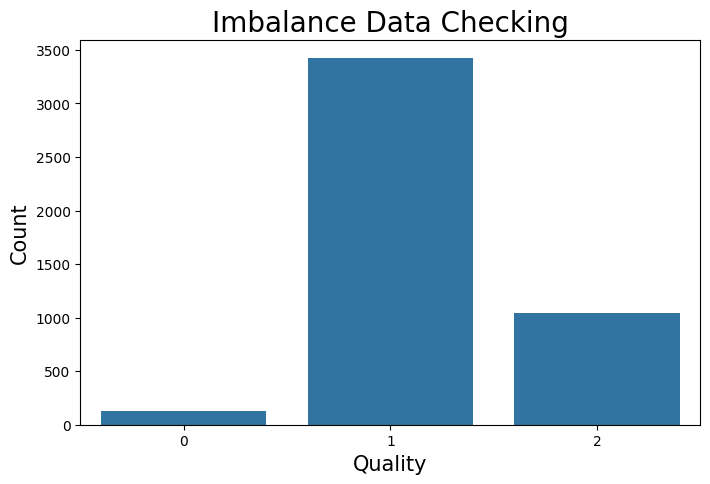

In [70]:
plt.figure(figsize=(8, 5))
sns.countplot(data=df_cleaned,x='quality')
plt.title("Imbalance Data Checking",fontsize=20)
plt.xlabel("Quality",fontsize=15)
plt.ylabel("Count",fontsize=15)
plt.show()

In [71]:
# using SMOTE (Synthetic minority Oversampling technique)

In [72]:
from imblearn.over_sampling import SMOTE
smote = SMOTE(random_state=45)
smote

SMOTE(random_state=45)

In [73]:
x,y = smote.fit_resample(df_cleaned.iloc[:,:11],df_cleaned[["quality"]])

In [74]:
y

,quality
0,1
1,1
2,1
3,1
4,2
...,...
10267,2
10268,2
10269,2
10270,2


In [75]:
x

,fixed_acidity,volatile_acidity,citric_acid,residual_sugar,chlorides,free_sulfur_dioxide,total_sulfur_dioxide,density,pH,sulphates,alcohol
0,2.177319,-0.568405,1.465829,-0.924287,2.036746,0.008964,-1.397506,0.991677,1.318787,0.431567,-0.996061
1,-0.715100,1.094309,-2.132020,-1.204995,2.169078,-1.678537,-3.361408,0.531655,0.970064,0.683295,-1.090781
2,0.855410,1.239550,-0.804161,-0.924287,2.169078,-3.439499,-4.872147,0.779434,0.551597,0.921883,-0.902343
3,0.046484,2.369493,-3.074151,1.066648,1.852048,0.568766,-0.732878,1.874651,1.737253,0.344481,-0.996061
4,1.388817,1.018871,-0.299332,-0.752106,1.503035,-1.387735,-2.817199,0.991677,0.202875,1.895341,-0.717831
...,...,...,...,...,...,...,...,...,...,...,...
10267,-0.325651,0.695849,-0.804161,-0.247257,-0.793468,0.008964,-0.371825,-1.310900,-0.703803,-0.855022,1.385294
10268,1.247755,-0.006886,0.031673,0.930333,-0.668798,0.232897,-0.149729,0.414218,-0.452936,-0.970773,-0.144896
10269,0.632153,-1.493260,-0.418433,1.480590,0.541799,-0.249401,0.263429,1.557035,-2.098692,-0.524380,-1.681417
10270,0.190340,-2.201597,-0.083965,-0.363728,-2.929238,-1.007863,-2.201600,-1.441638,-1.248469,0.360920,1.154016


<Axes: xlabel='quality', ylabel='Count'>

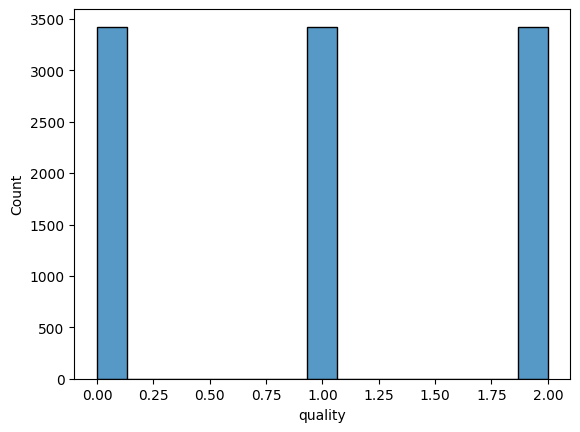

In [76]:
sns.histplot(x=y['quality']) # now the dataset is balanced

# Train and Test Split

In [78]:
train = x
test = y['quality']

In [79]:
from sklearn.model_selection import train_test_split
x_train,x_test,y_train,y_test = train_test_split(train,test,test_size=0.3, random_state=42)

In [80]:
x_train

,fixed_acidity,volatile_acidity,citric_acid,residual_sugar,chlorides,free_sulfur_dioxide,total_sulfur_dioxide,density,pH,sulphates,alcohol
3437,-0.715100,0.519782,0.137970,-1.127933,-0.500708,-1.527070,-0.913338,-1.446186,0.691086,-0.216045,1.385294
6622,-0.932588,0.835979,-0.302509,0.948746,1.205047,-2.403682,-0.067605,0.357773,0.201966,-0.321349,0.292986
2262,-0.325651,-0.994172,1.105587,1.087333,0.177013,1.058640,0.533130,1.246201,2.225465,2.139233,-0.100728
2246,0.744526,0.427578,-0.804161,0.608528,-1.113289,-0.052122,0.352495,-0.010525,-0.285336,-1.089530,0.067968
835,-0.985177,-0.083245,1.664369,-0.700145,0.541799,1.303360,0.533130,-0.390193,-0.843292,0.998723,-0.626997
...,...,...,...,...,...,...,...,...,...,...,...
5734,1.761146,0.642487,0.981180,-1.478125,-0.733938,-0.883166,-0.616045,-0.939670,-0.332903,-1.994310,1.153116
5191,0.093251,-0.396629,0.286055,-1.306791,0.137514,-2.764419,0.012540,-0.953640,-0.346134,-0.225778,0.466914
5390,0.668245,0.462479,-1.003085,1.281264,0.855716,-0.498523,0.364035,1.540156,-0.312557,0.102501,-0.804129
860,0.166941,0.233892,0.613427,0.194292,-0.793468,-0.181127,0.138310,-0.425697,-0.215592,-0.419274,0.233510


In [81]:
y_train

3437    1
6622    0
2262    1
2246    2
835     1
       ..
5734    0
5191    0
5390    0
860     1
7270    0
Name: quality, Length: 7190, dtype: int64

In [82]:
x_test

,fixed_acidity,volatile_acidity,citric_acid,residual_sugar,chlorides,free_sulfur_dioxide,total_sulfur_dioxide,density,pH,sulphates,alcohol
8047,-0.169616,-2.362529,0.312749,0.678031,0.285797,0.493465,-0.079363,0.727820,1.544971,-0.883154,-1.161358
7809,0.855410,0.427578,-0.943539,1.258049,0.808259,-0.637842,0.323234,1.542912,-0.285336,0.165168,-0.717831
3658,-0.849049,0.427578,-0.943539,-0.247257,0.677592,0.285858,-0.100916,0.102941,-0.285336,-0.021466,-1.992195
318,-0.849049,2.196425,-3.671236,-0.752106,0.400462,-3.439499,-4.872147,0.170294,1.667509,2.079469,0.233510
3014,0.632153,-0.439308,0.700763,0.822613,0.677592,0.611750,0.479227,0.474996,-0.982781,-0.216045,-0.186296
...,...,...,...,...,...,...,...,...,...,...,...
4216,-0.325651,-0.083245,1.970658,1.473360,0.743542,0.180325,0.352495,1.451100,-0.634059,0.072803,-1.090781
5386,-1.242764,0.715291,-0.718453,-0.918568,-0.555725,-3.424561,-0.791787,-1.103483,0.551597,-1.167114,0.757203
9004,-0.669706,0.665301,0.255707,0.165275,-0.638587,-0.621000,-0.762497,-0.807843,1.128034,0.870621,1.166610
7352,0.386643,0.448746,0.523698,-0.258795,0.134722,-0.003695,0.956224,0.291840,1.447187,0.433831,-0.065090


In [83]:
y_test

8047    2
7809    0
3658    1
318     1
3014    1
       ..
4216    1
5386    0
9004    2
7352    0
7670    0
Name: quality, Length: 3082, dtype: int64

# Model Selection and Training

- Choose several classification algorithms to evaluate:
1. Logistic Regression
2. Support Vector Machine (SVM)
3. Random Forest
4. k-Nearest Neighbors (KNN)
5. Decision Tree

In [86]:
# models
models = {
    "Logistic Regression": LogisticRegression(),
    "SVM": SVC(),
    "Random Forest": RandomForestClassifier(),
    "K-Nearest Neighbors": KNeighborsClassifier(),
    "Decision Tree": DecisionTreeClassifier(),
}

# Hyperparameter grids for tuning
param_grids = {
    "Logistic Regression": {
        "C": np.logspace(-4, 4, 10),
        "solver": ["liblinear"]
    },
    "SVM": {
        "C": [0.1, 1, 10, 100],
        "kernel": ["linear", "rbf"]
    },
    "Random Forest": {
        "n_estimators": [50, 100, 200],
        "max_depth": [None, 10, 20, 30],
        "min_samples_split": [2, 5, 10]
    },
    "K-Nearest Neighbors": {
        "n_neighbors": range(1, 20),
        "weights": ["uniform", "distance"]
    },
    "Decision Tree": {
        "criterion": ["gini", "entropy"],  # Corrected parameter name
        "max_depth": [None, 10, 20, 30],
        "min_samples_split": [2, 5, 10]
    }
}


In [87]:
param_grids['Logistic Regression']

{'C': array([1.00000000e-04, 7.74263683e-04, 5.99484250e-03, 4.64158883e-02,
        3.59381366e-01, 2.78255940e+00, 2.15443469e+01, 1.66810054e+02,
        1.29154967e+03, 1.00000000e+04]),
 'solver': ['liblinear']}

In [88]:
def best_model(x_train,y_train):
    best_models = {}
    for model_name, model in models.items():
        print(f"Running GridSearchCv for {model_name}\n")
        # n_jobs = -1 means it will use all processors
        grid = GridSearchCV(model,param_grids[model_name],refit=True,scoring='accuracy', cv=5, n_jobs=-1 )
        grid.fit(x_train,y_train)

        # best model
        best_model = grid.best_estimator_
        best_models[model_name] = best_model
        print(f"{model_name} best parameters: {grid.best_params_}")
        print(f"{model_name} best cross-validated accuracy: {grid.best_score_}")

    for model_name, model in best_models.items():
        y_pred = model.predict(x_test)  # Generate predictions on test set
        accuracy = accuracy_score(y_test, y_pred)
        print(f"\n{model_name} Test Accuracy: {accuracy}")
        print("Classification Report:")
        print(classification_report(y_test, y_pred))
        print("Confusion Matrix:")
        print(confusion_matrix(y_test, y_pred))

In [89]:
x_train.shape

(7190, 11)

In [90]:
y_train.shape

(7190,)

In [91]:
best_model(x_train,y_train) # Final result 

Running GridSearchCv for Logistic Regression

Logistic Regression best parameters: {'C': 0.3593813663804626, 'solver': 'liblinear'}
Logistic Regression best cross-validated accuracy: 0.6397774687065368
Running GridSearchCv for SVM




KeyboardInterrupt



## Insights 

### Best Parameters and Accuracy
1. Running GridSearchCv for Logistic Regression
- Logistic Regression best parameters: {'C': 0.3593813663804626, 'solver': 'liblinear'}
- Logistic Regression best cross-validated accuracy: 0.6397774687065368
- Logistic Regression Test Accuracy: 0.6320571057754705

2. Running GridSearchCv for SVM
- SVM best parameters: {'C': 100, 'kernel': 'rbf'}
- SVM best cross-validated accuracy: 0.9066759388038943
- SVM Test Accuracy: 0.90914990266061

3. Running GridSearchCv for Random Forest
- Random Forest best parameters: {'max_depth': 30, 'min_samples_split': 2, 'n_estimators': 200}
- Random Forest best cross-validated accuracy: 0.9127955493741308
- Random Forest Test Accuracy: 0.9227774172615185

4. Running GridSearchCv for K-Nearest Neighbors
- K-Nearest Neighbors best parameters: {'n_neighbors': 1, 'weights': 'uniform'}
- K-Nearest Neighbors best cross-validated accuracy: 0.9165507649513213
- K-Nearest Neighbors Test Accuracy: 0.9250486696950032

5. Running GridSearchCv for Decision Tree
- Decision Tree best parameters: {'criterion': 'entropy', 'max_depth': 20, 'min_samples_split': 2}
- Decision Tree best cross-validated accuracy: 0.8458970792767733
- Decision Tree Test Accuracy: 0.8426346528228423

# Testing Models

In [ ]:
from sklearn.metrics import accuracy_score, classification_report, confusion_matrix
import seaborn as sns
import matplotlib.pyplot as plt

def test_model(model, x_test, y_test):
    
    y_pred = model.predict(x_test)
    
    accuracy = accuracy_score(y_test, y_pred)
    print(f"Test Accuracy: {accuracy}")
    print("\nClassification Report:")
    print(classification_report(y_test, y_pred))
    
    cm = confusion_matrix(y_test, y_pred)
    plt.figure(figsize=(8, 6))
    sns.heatmap(cm, annot=True, fmt="d", cmap="Blues",
                xticklabels=['Low', 'Medium', 'High'], 
                yticklabels=['Low', 'Medium', 'High'])
    plt.xlabel("Predicted Labels")
    plt.ylabel("True Labels")
    plt.title("Confusion Matrix")
    plt.show()

In [ ]:
from sklearn.ensemble import RandomForestClassifier
from sklearn.neighbors import KNeighborsClassifier

# Instantiate Models with Best Parameters
knn_model = KNeighborsClassifier(n_neighbors= 1, weights= 'uniform')
rf_model = RandomForestClassifier(n_estimators= 200, max_depth= 30, min_samples_split= 2)

# Fit Models on Training Data
knn_model.fit(x_train, y_train)
rf_model.fit(x_train, y_train)

# Test the Models
print("K-Nearest Neighbors Model Evaluation:")
test_model(knn_model, x_test, y_test)

print("\nRandom Forest Model Evaluation:")
test_model(rf_model, x_test, y_test)


# Selected Model

- Based on test accuracy and consistency across performance metrics, __K-Nearest Neighbors (92.50%)__ and __Random Forest (92.28%)__ were the top performers. Either model could be selected, depending on the computational resources available, as KNN is more computationally intensive at prediction time, especially on large datasets.

# Summary
- Best Model: Both Random Forest and K-Nearest Neighbors show high accuracy, precision, and recall across classes, making them ideal choices for this classification task.

- Secondary Model: SVM offers strong performance with interpretability for cases where clear decision boundaries are preferred.

- Business Insight: The high performance of Random Forest and KNN on both high and low-quality predictions suggests they could be leveraged for practical business decisions, such as customer segmentation and quality control in production.

# Present the results, compare the performance of the two algorithms, justifying performance metrics

To present and compare the performance of the two best algorithms, **Random Forest** and **K-Nearest Neighbors (KNN)**, let's examine their results and key performance metrics in detail. Justifying the metrics used will also help us understand how well each model meets the classification task requirements for predicting wine quality.

---

### 1. Key Performance Metrics Justification

The metrics we chose to evaluate these models are:
   - **Accuracy**: Measures overall model correctness across all classes. Useful as a quick performance summary, especially for a balanced dataset.
   - **Precision**: Evaluates the accuracy of positive predictions. This is particularly helpful in quality classification where false positives (incorrectly labeling lower quality as higher) should be minimized.
   - **Recall**: Measures how well each class is identified. High recall ensures that few instances from a class (e.g., high-quality wines) are missed.
   - **F1-Score**: The harmonic mean of precision and recall, balancing both metrics to provide a consolidated view of performance for each class.
   - **Confusion Matrix**: Offers insight into specific areas where the model confuses classes, helping us understand classification strengths and weaknesses.

---

### 2. Results for Random Forest and K-Nearest Neighbors

#### Random Forest
   - **Test Accuracy**: 92.3%
   - **Precision, Recall, and F1-Score**:
     - **Low Quality (Class 0)**: Precision 0.95, Recall 0.99, F1-Score 0.97
     - **Medium Quality (Class 1)**: Precision 0.92, Recall 0.85, F1-Score 0.89
     - **High Quality (Class 2)**: Precision 0.90, Recall 0.93, F1-Score 0.91
   - **Confusion Matrix**:
     ```
     [[964   6   2]
      [ 41 896 111]
      [  6  72 984]]
     ```

**Interpretation**:
   - Random Forest achieves strong results across all classes, especially with high precision and recall for the low and high-quality categories. The balanced recall and precision minimize false positives and false negatives, making this model highly reliable for this classification task.
   - The confusion matrix shows that Random Forest only slightly misclassifies medium and high-quality wines, suggesting it manages complex class boundaries effectively.

#### K-Nearest Neighbors (KNN)
   - **Test Accuracy**: 93.0%
   - **Precision, Recall, and F1-Score**:
     - **Low Quality (Class 0)**: Precision 0.94, Recall 1.00, F1-Score 0.97
     - **Medium Quality (Class 1)**: Precision 0.98, Recall 0.80, F1-Score 0.88
     - **High Quality (Class 2)**: Precision 0.88, Recall 0.98, F1-Score 0.93
   - **Confusion Matrix**:
     ```
     [[ 972    0    0]
      [  65  834  149]
      [   1   16 1045]]
     ```

   **Interpretation**:
   - KNN shows excellent performance with a slightly higher accuracy than Random Forest. High recall and precision values, especially for high-quality wines, indicate that KNN accurately classifies instances in extreme quality classes.
   - The confusion matrix shows nearly perfect results for low and high-quality classes but suggests some challenges in differentiating medium-quality wines from other classes, leading to lower recall in this category.

---

### 3. Comparative Analysis

| Metric            | Random Forest               | K-Nearest Neighbors          |
|-------------------|-----------------------------|------------------------------|
| **Test Accuracy** | 92.3%                       | **93.0%**                    |
| **Precision**     | 0.92 (average)              | **0.93 (average)**           |
| **Recall**        | **0.92 (average)**          | 0.93 (average)               |
| **F1-Score**      | 0.92 (average)              | **0.93 (average)**           |
| **Strengths**     | Robustness, interpretability, adaptability | High accuracy, good recall |
| **Weaknesses**    | Higher computational cost   | Sensitive to imbalanced classes|

- **Performance Comparison**: Both models show excellent performance, with **KNN slightly outperforming Random Forest in accuracy**. KNN achieves this through nearly perfect classification of low and high-quality wines but at the cost of some misclassification in the medium category.

- **Metric Justification**: Given the business requirement to accurately distinguish wine quality levels, high precision in both models minimizes false positives for quality, ensuring that only truly high-quality wines are identified as such. High recall values further ensure that instances in each quality category are not misclassified. These metrics balance the need for accurate and reliable classifications without missing or overestimating any quality categories.

### 4. Final Recommendation

**K-Nearest Neighbors (KNN)** would be a suitable choice given its slightly higher accuracy and strong performance in identifying low and high-quality wines. However, **Random Forest** remains an excellent alternative if interpretability and consistent performance across different class boundaries are prioritized.